"""
This notebook adds some visualizations to the functions in imaging_interview.py 
to better understand the change score and find the optimal input parameters.
"""

In [202]:
import cv2
import imutils
import os
import numpy as np
import matplotlib.pyplot as plt

def draw_color_mask(img, borders, color=(0, 0, 0)):
    """Applies a colored mask to the image by blacking out certain border areas."""
    h, w = img.shape[:2]

    x_min = int(borders[0] * w / 100)
    x_max = w - int(borders[2] * w / 100)
    y_min = int(borders[1] * h / 100)
    y_max = h - int(borders[3] * h / 100)

    img = cv2.rectangle(img, (0, 0), (x_min, h), color, -1)
    img = cv2.rectangle(img, (0, 0), (w, y_min), color, -1)
    img = cv2.rectangle(img, (x_max, 0), (w, h), color, -1)
    img = cv2.rectangle(img, (0, y_max), (w, h), color, -1)

    return img

def preprocess_image_change_detection(img, gaussian_blur_radius_list=None, black_mask=(5, 10, 5, 0)):
    """Converts an image to grayscale, applies optional Gaussian blur and a black mask."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    if gaussian_blur_radius_list:
        for radius in gaussian_blur_radius_list:
            gray = cv2.GaussianBlur(gray, (radius, radius), 0)

    gray = draw_color_mask(gray, black_mask)
    return gray

def compare_frames_change_detection(first_image, second_image, min_contour_area, show_frame_diff):
    prev_frame = preprocess_image_change_detection(cv2.imread(os.path.join(image_folder, first_image)))
    next_frame = preprocess_image_change_detection(cv2.imread(os.path.join(image_folder, second_image)))
    # Compute absolute difference between frames
    frame_delta = cv2.absdiff(prev_frame, next_frame)

    # Apply thresholding to highlight significant changes
    thresh = cv2.threshold(frame_delta, 45, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.dilate(thresh, None, iterations=2)

    # Find contours of significant changes
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)

    score = 0
    res_cnts = []
    for c in cnts:
        if cv2.contourArea(c) < min_contour_area:
            continue

        res_cnts.append(c)
        score += cv2.contourArea(c)

    # Convert images to RGB for proper visualization in Matplotlib
    prev_frame_rgb = cv2.cvtColor(cv2.imread(os.path.join(image_folder, first_image)), cv2.COLOR_BGR2RGB)
    output_rgb = cv2.cvtColor(cv2.imread(os.path.join(image_folder, second_image)), cv2.COLOR_BGR2RGB)
    frame_delta_rgb = cv2.cvtColor(frame_delta, cv2.COLOR_BGR2RGB)
    thresh_rgb = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)  # Keep threshold as grayscale but in RGB format

    # Draw contours on the output image
    cv2.drawContours(output_rgb, res_cnts, -1, (0, 255, 0), 2)  # Green contours

    # Create the figure
    if show_frame_diff:
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))

        # First row (Original & Detected Changes)
        axes[0, 0].imshow(prev_frame_rgb)
        axes[0, 0].set_title("First Image")
        axes[0, 0].axis("off")

        axes[0, 1].imshow(output_rgb)
        axes[0, 1].set_title("Second Image with Detected Changes")
        axes[0, 1].axis("off")

        # Second row (Frame Difference & Threshold Image)
        axes[1, 0].imshow(frame_delta_rgb, cmap='hot')
        axes[1, 0].set_title("Frame Difference (Heatmap)")
        axes[1, 0].axis("off")

        axes[1, 1].imshow(thresh_rgb, cmap='gray')
        axes[1, 1].set_title("Threshold Image (Binary)")
        axes[1, 1].axis("off")
    else:
        fig, axes = plt.subplots(1, 2, figsize=(12, 8))  # 1 row, 2 columns

        # Display original image
        axes[0].imshow(cv2.cvtColor(prev_frame_rgb, cv2.COLOR_BGR2RGB))
        axes[0].set_title("Original Image")
        axes[0].axis("off")

        # Display detected changes image
        axes[1].imshow(cv2.cvtColor(output_rgb, cv2.COLOR_BGR2RGB))
        axes[1].set_title("Detected Changes")
        axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    return score, res_cnts, thresh

def visualize_differences(first_image, second_image, min_contour_area=500, show_frame_diff = True):
    """Computes frame differences, detects contours, and visualizes changes."""
    # compare the two images
    score, res_cntrs, thresh = compare_frames_change_detection(first_image, second_image, min_contour_area, show_frame_diff)
    #print(score, res_cntrs, thresh)  
    print("Score:", score)
    print("Number of Detected Changes:", len(res_cntrs))

image_folder = os.path.expanduser("~/Downloads/dataset-candidates-ml/dataset")

Min Contour Area: 50


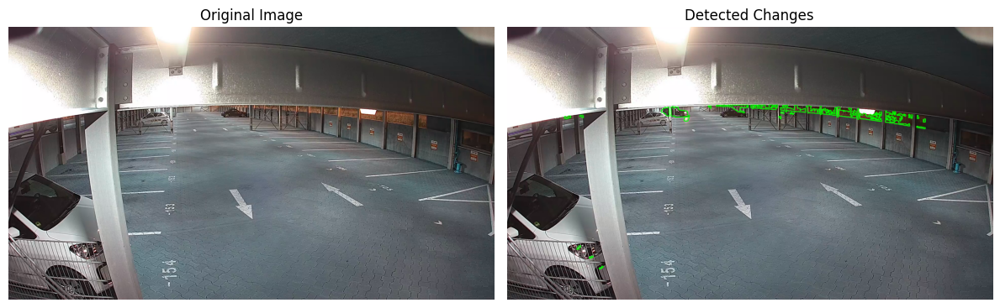

Score: 15256.0
Number of Detected Changes: 38
----------------------------------------------------------------------------------------------------
Min Contour Area: 200


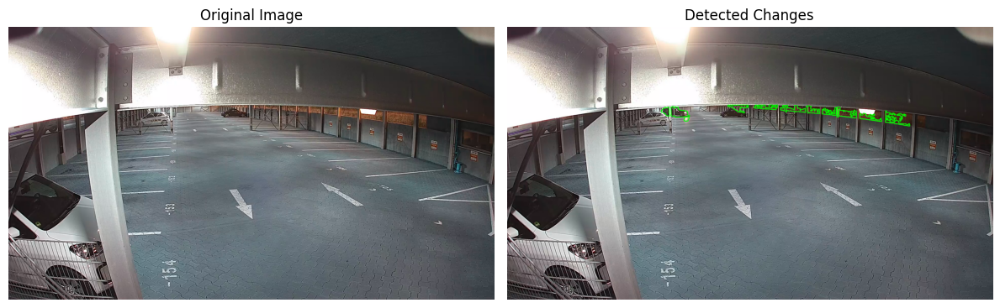

Score: 12741.5
Number of Detected Changes: 15
----------------------------------------------------------------------------------------------------
Min Contour Area: 500


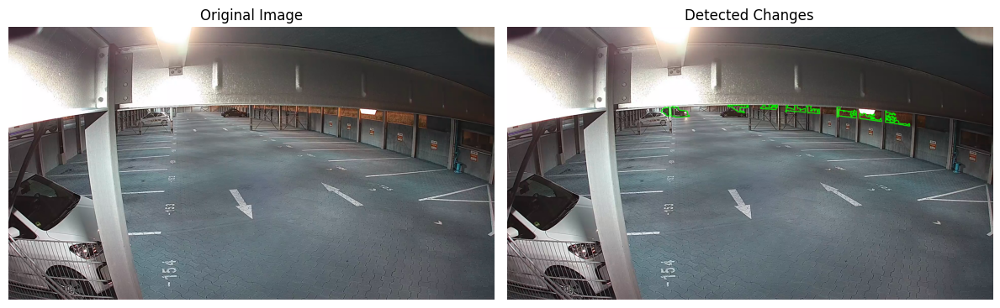

Score: 10923.5
Number of Detected Changes: 9
----------------------------------------------------------------------------------------------------
Min Contour Area: 1000


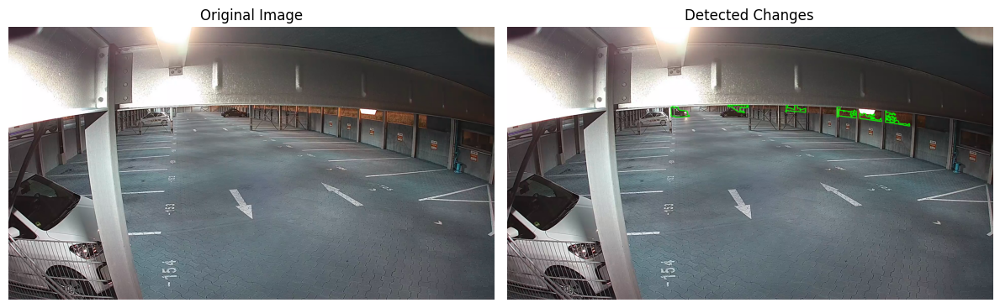

Score: 8611.0
Number of Detected Changes: 6
----------------------------------------------------------------------------------------------------
Min Contour Area: 5000


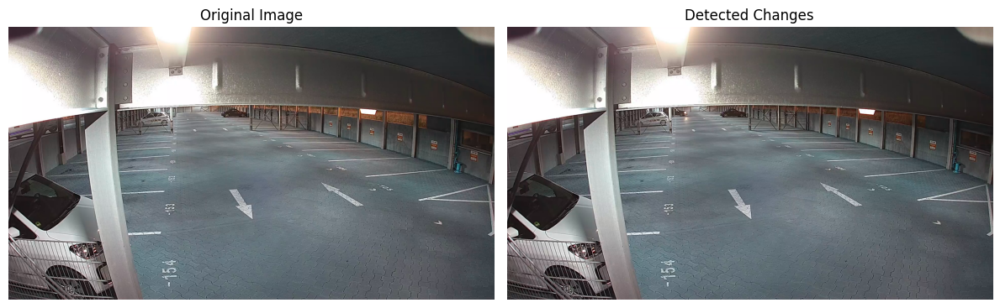

Score: 0
Number of Detected Changes: 0
----------------------------------------------------------------------------------------------------


In [ ]:
# case 1
min_contour_values = [50, 200, 500, 1000, 5000] 
first_image = "c20_2021_03_26__17_52_34.png"
second_image = "c20_2021_03_26__17_58_17.png"
for min_contour_area in min_contour_values:
    print(f"Min Contour Area: {min_contour_area}")
    visualize_differences(first_image, second_image, min_contour_area, show_frame_diff = False)
    #print separator
    print("-" * 100)

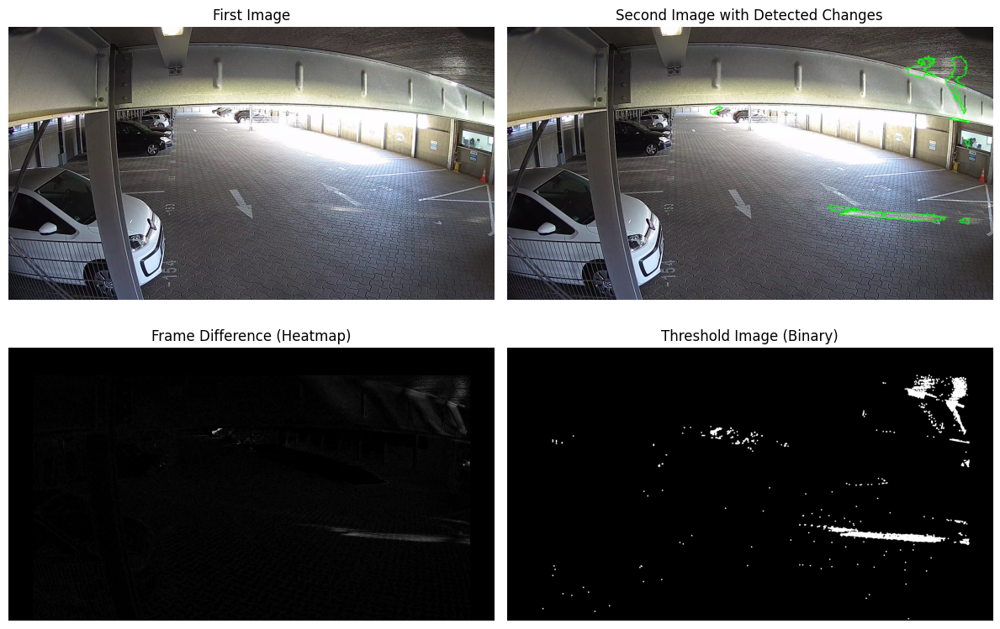

Score: 23315.0
Number of Detected Changes: 7


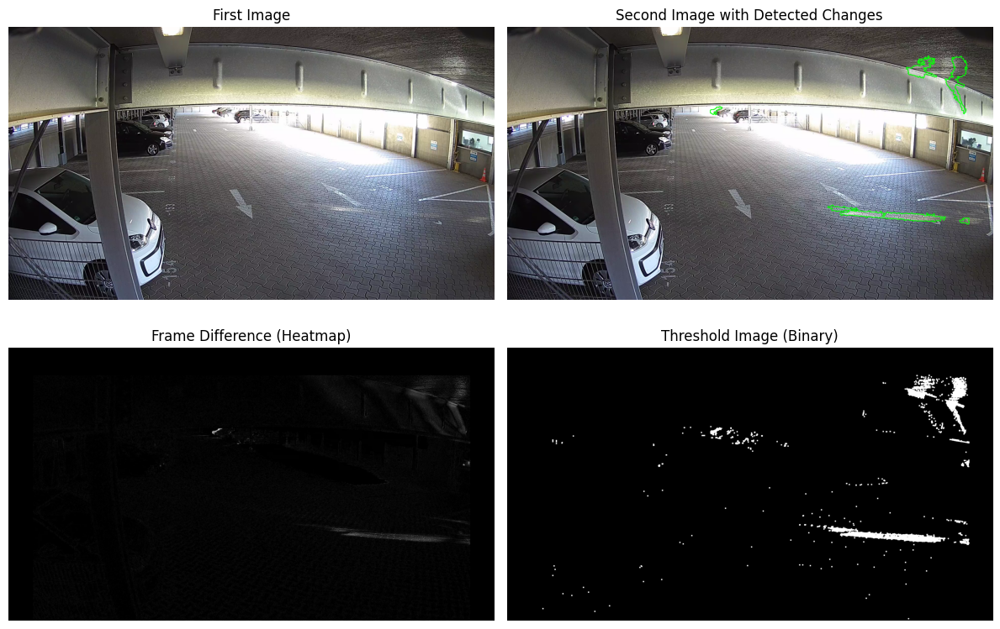

Score: 22584.5
Number of Detected Changes: 5


In [ ]:
# case 2
first_image = "c20_2021_04_27__15_01_42.png"
second_image = "c20_2021_04_27__15_07_24.png"
visualize_differences(first_image, second_image, min_contour_area=200)
visualize_differences(first_image, second_image, min_contour_area=500)

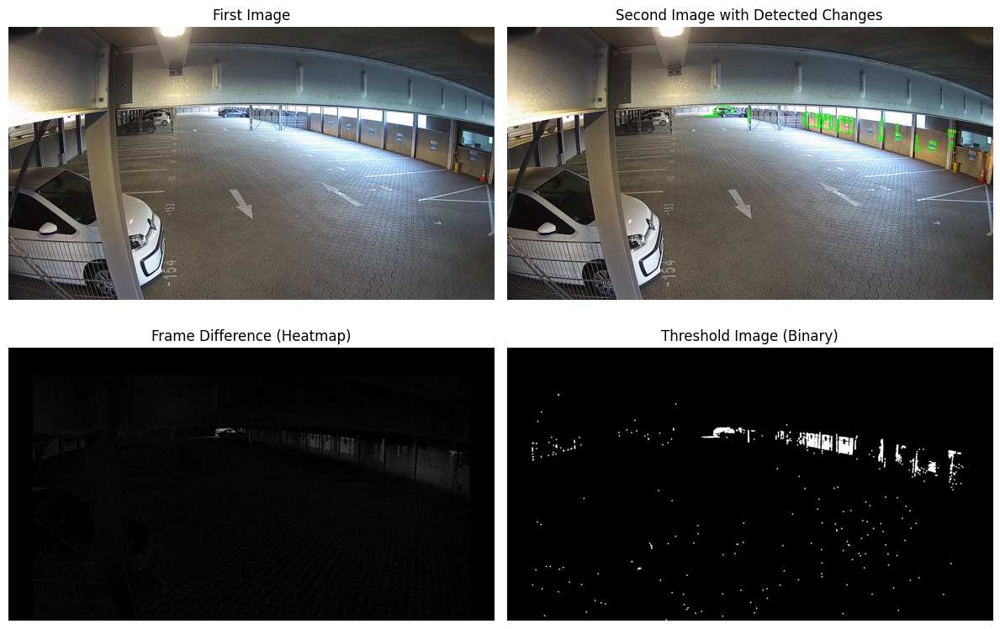

Score: 14419.0
Number of Detected Changes: 14


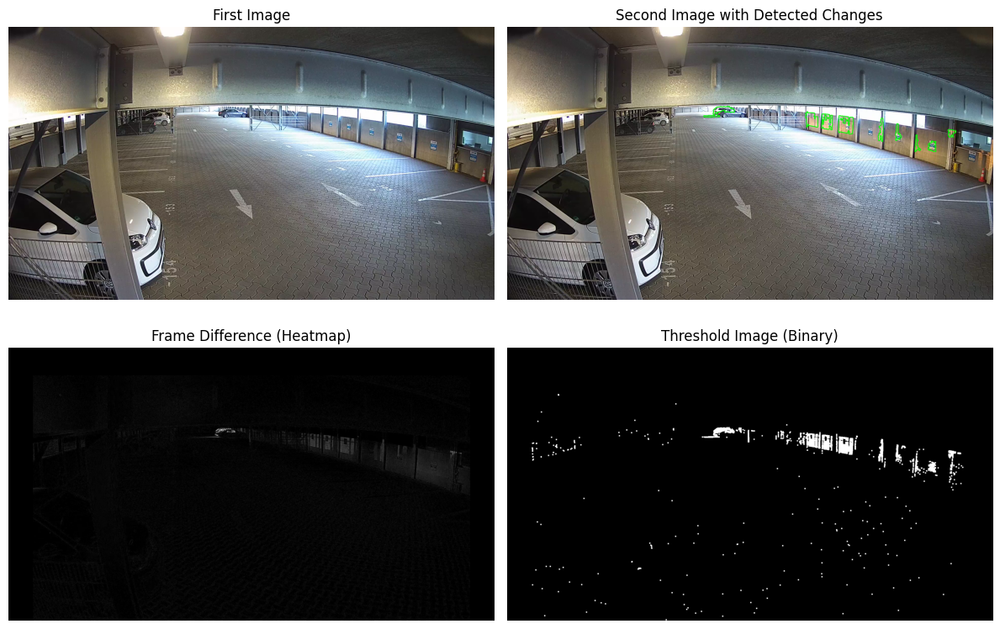

Score: 13065.5
Number of Detected Changes: 9


In [ ]:
# case 3
first_image = "c20_2021_04_28__04_20_18.png"
second_image = "c20_2021_04_28__04_26_00.png"
visualize_differences(first_image, second_image, min_contour_area=200)
visualize_differences(first_image, second_image, min_contour_area=500)

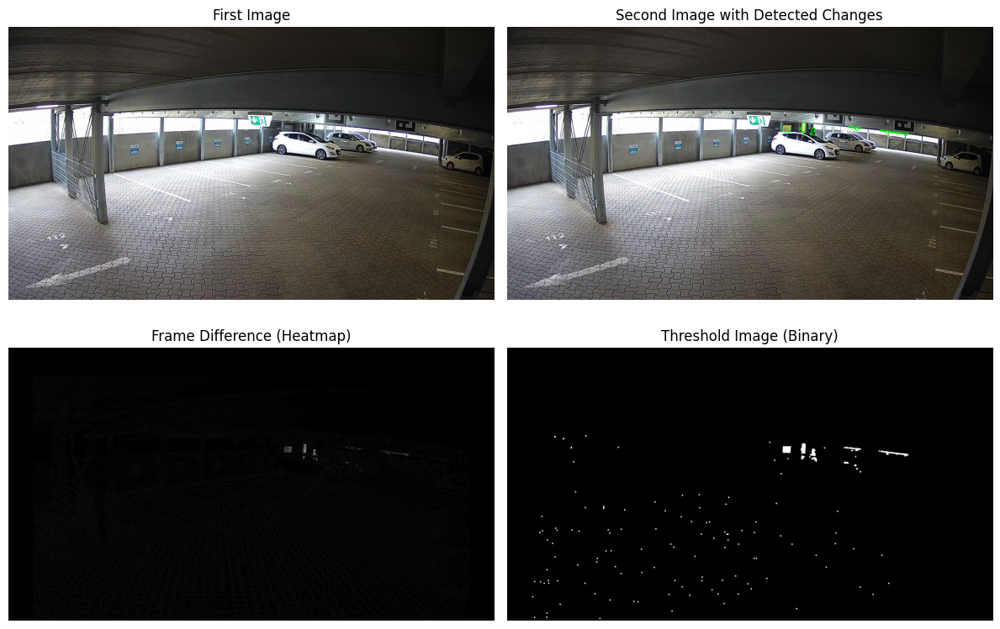

Score: 2701.0
Number of Detected Changes: 5


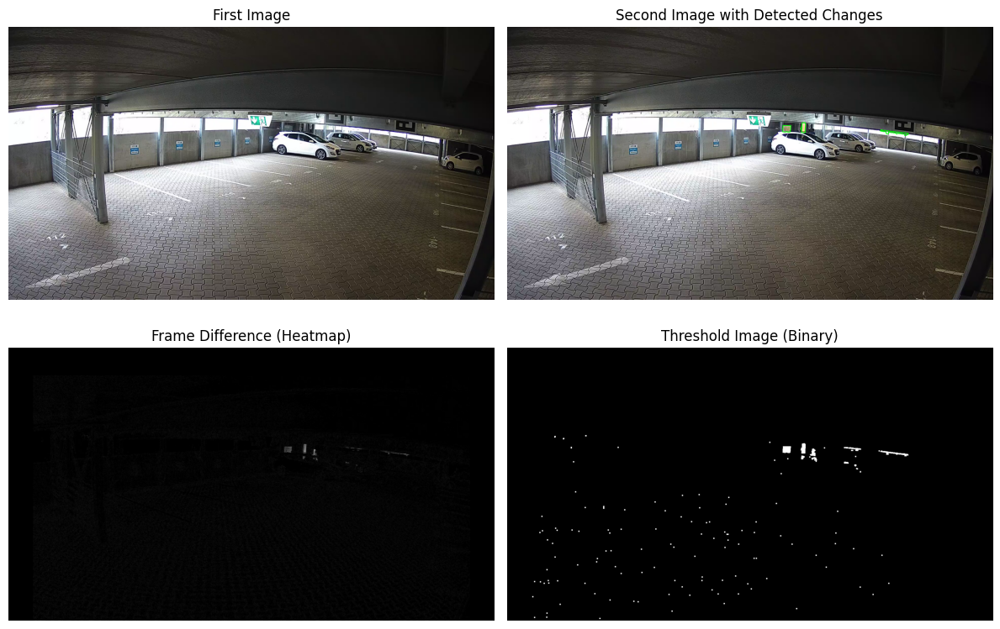

Score: 2034.0
Number of Detected Changes: 3


In [206]:
# case 4
first_image = "c23-1616689078329.png"
second_image = "c23-1616689120916.png"
visualize_differences(first_image, second_image, min_contour_area=200)
visualize_differences(first_image, second_image, min_contour_area=500)

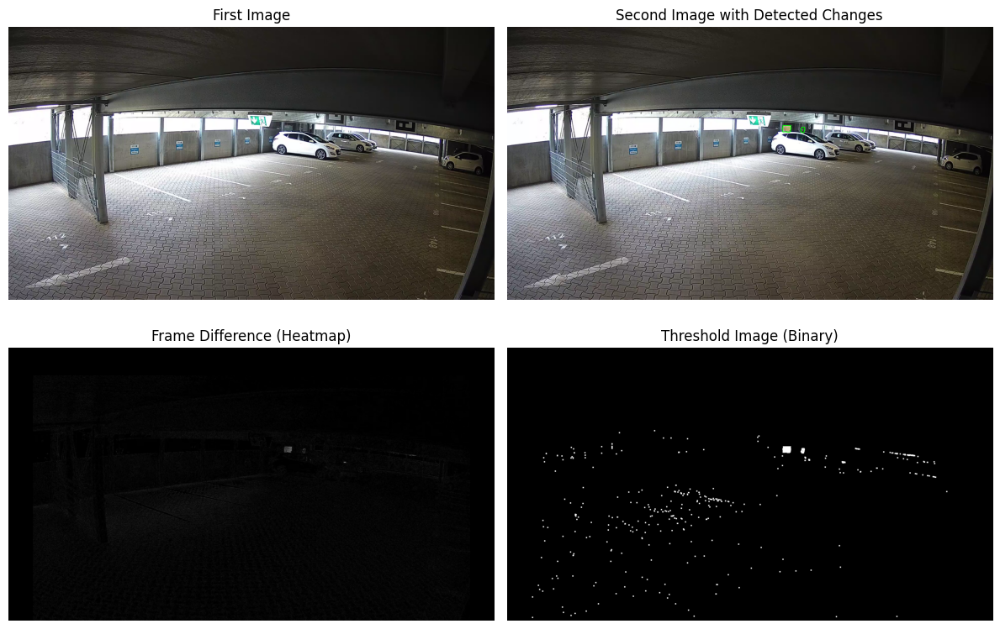

Score: 1063.5
Number of Detected Changes: 2


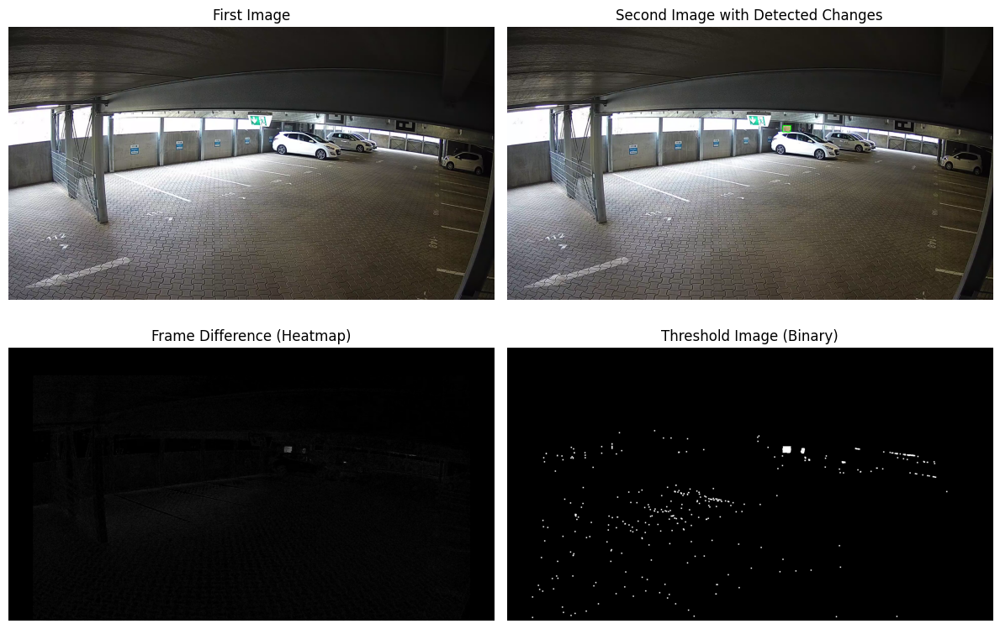

Score: 800.0
Number of Detected Changes: 1


In [207]:
# case 5 
first_image = "c23-1616689392406.png"
second_image = "c23-1616689734969.png"
visualize_differences(first_image, second_image, min_contour_area=200)
visualize_differences(first_image, second_image, min_contour_area=500)

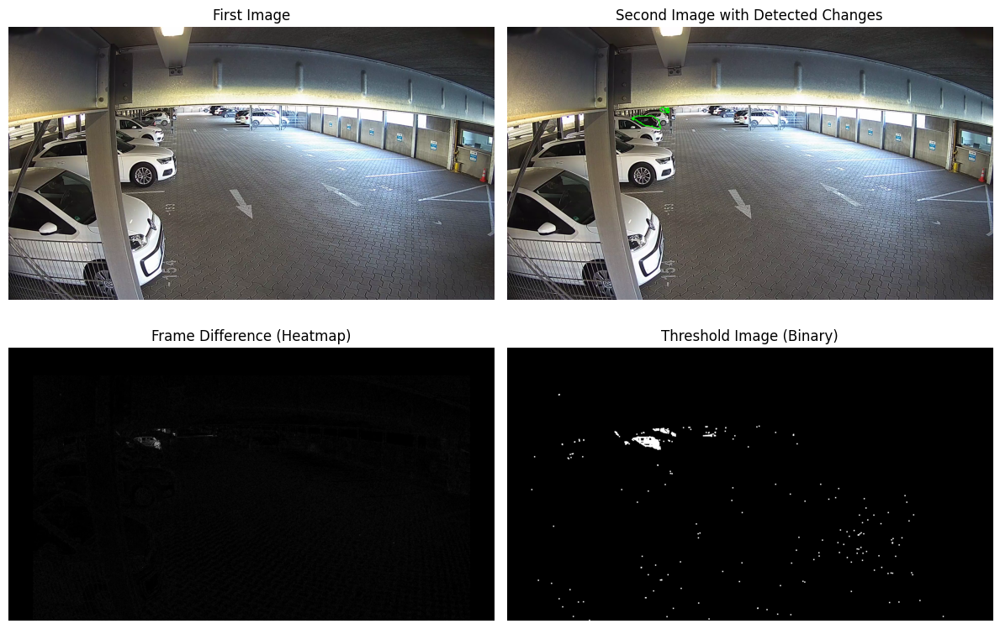

Score: 3908.0
Number of Detected Changes: 2


In [ ]:
# another case where both values work
first_image = "c20_2021_04_28__05_40_15.png"
second_image = "c20_2021_04_28__05_45_58.png"
visualize_differences(first_image, second_image, min_contour_area=200)
visualize_differences(first_image, second_image, min_contour_area=500)

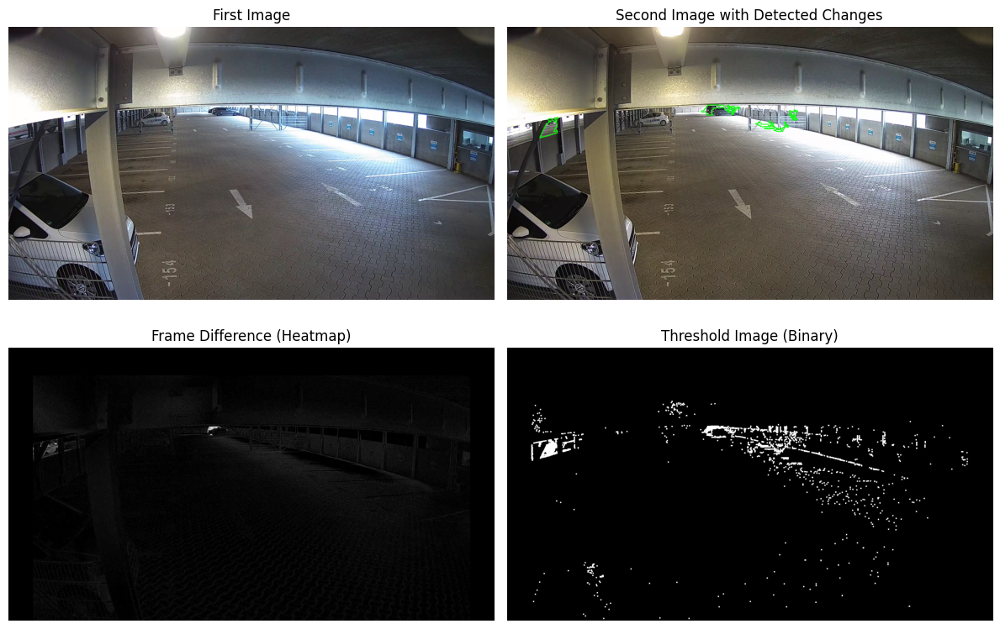

Score: 7431.5
Number of Detected Changes: 4


In [ ]:
# another case where both values work
first_image = "c20_2021_03_26__05_41_34.png"
second_image = "c20_2021_03_26__05_58_42.png"
visualize_differences(first_image, second_image, min_contour_area=200)
visualize_differences(first_image, second_image, min_contour_area=500)

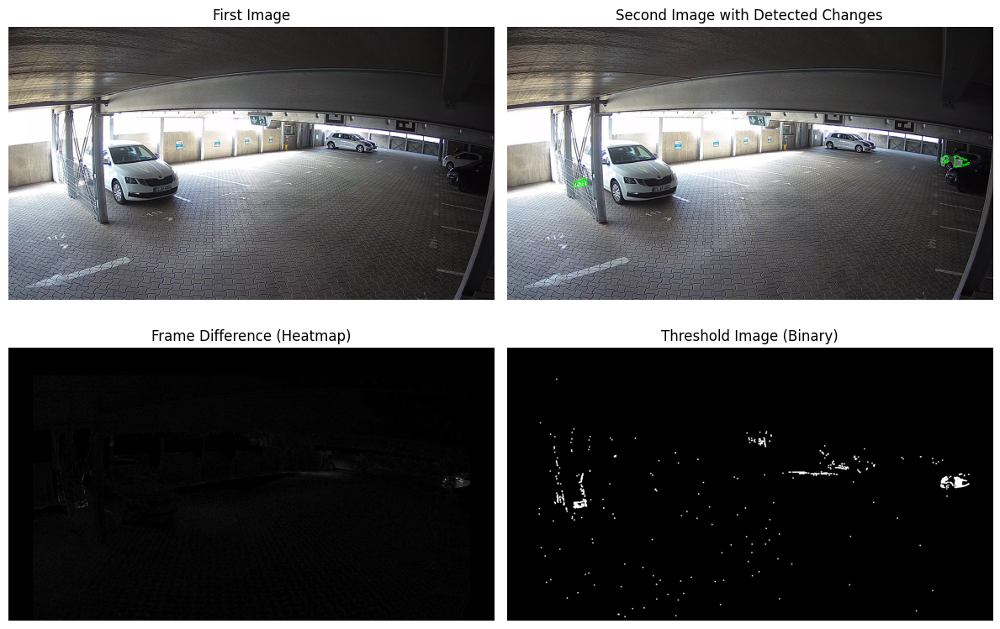

Score: 3096.0
Number of Detected Changes: 3


In [ ]:
# another case where both values work
first_image = "c23-1616759914240.png"
second_image = "c23-1616760256963.png"
visualize_differences(first_image, second_image, min_contour_area=200)
visualize_differences(first_image, second_image, min_contour_area=500)

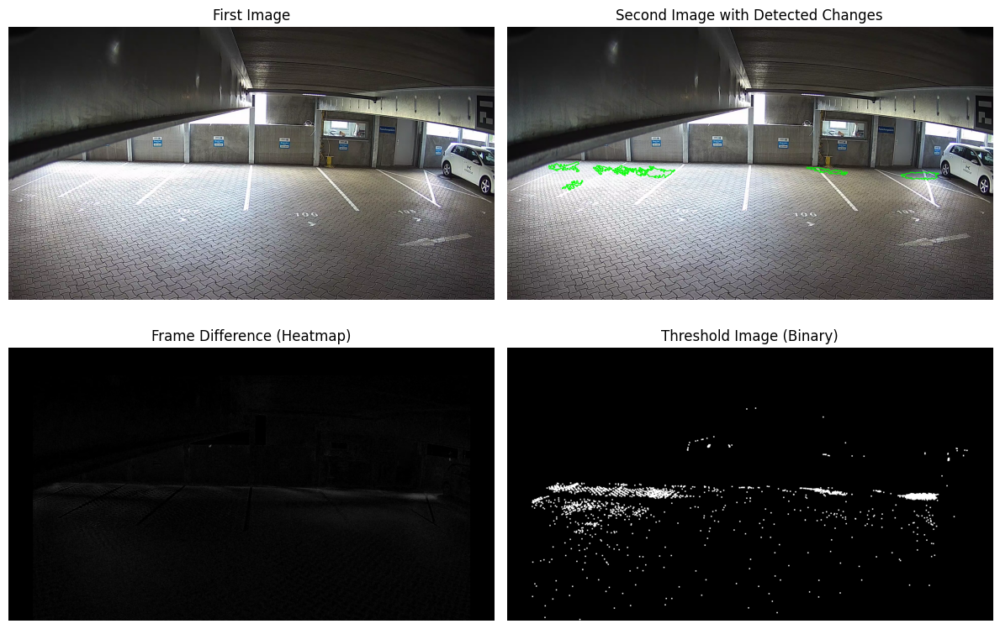

Score: 12313.0
Number of Detected Changes: 7


In [ ]:
# case 6
first_image = "c21_2021_03_26__10_10_01.png"
second_image = "c21_2021_03_26__10_15_44.png"
visualize_differences(first_image=first_image, second_image=second_image, min_contour_area=500)

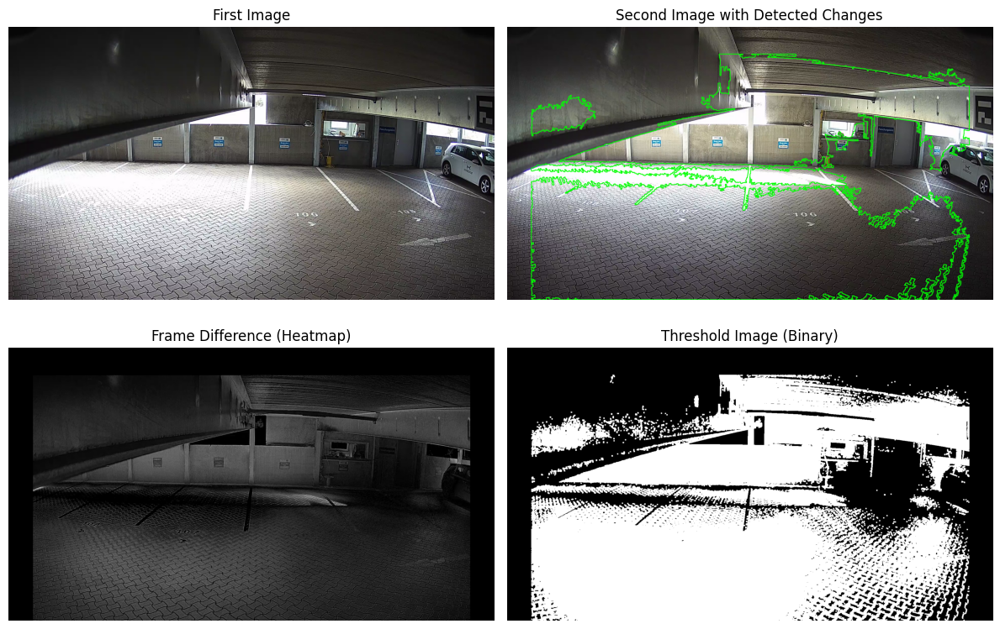

Score: 1157646.0
Number of Detected Changes: 6


In [ ]:
first_image = "c21_2021_03_27__13_10_45.png"
second_image = "c21_2021_03_27__13_16_27.png"
visualize_differences(first_image, second_image, min_contour_area=10000) #important even high min_contour_area doesn't work

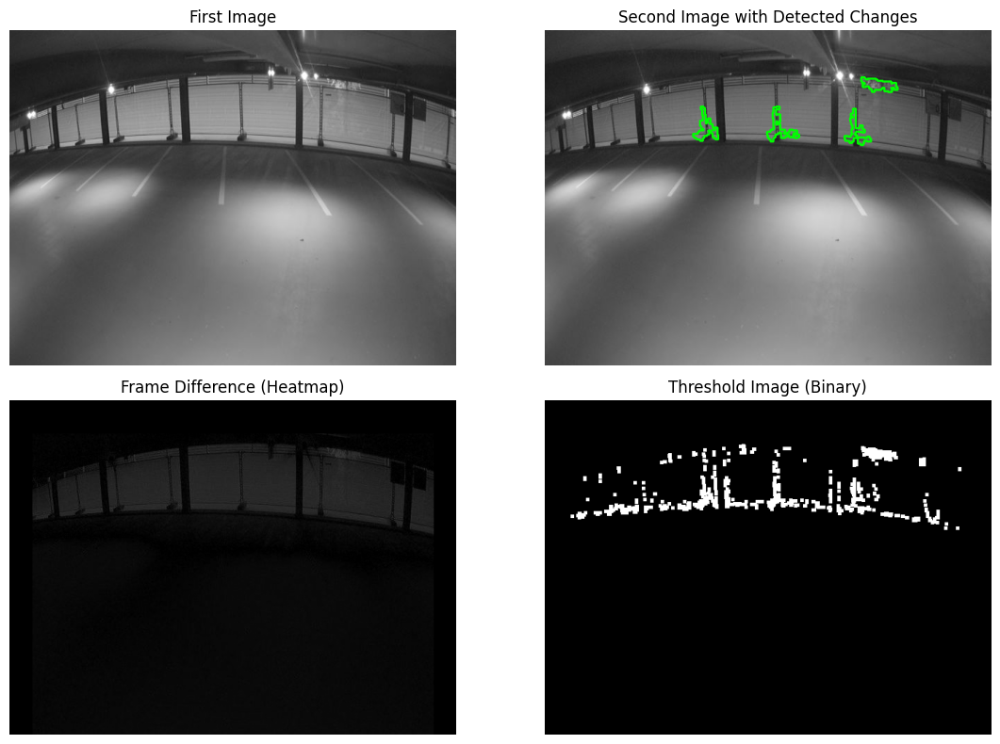

Score: 2525.5
Number of Detected Changes: 4


In [211]:
# case 7
first_image = "c10-1623872544167.png"
second_image = "c10-1623872887821.png"
visualize_differences(first_image, second_image, min_contour_area=500)

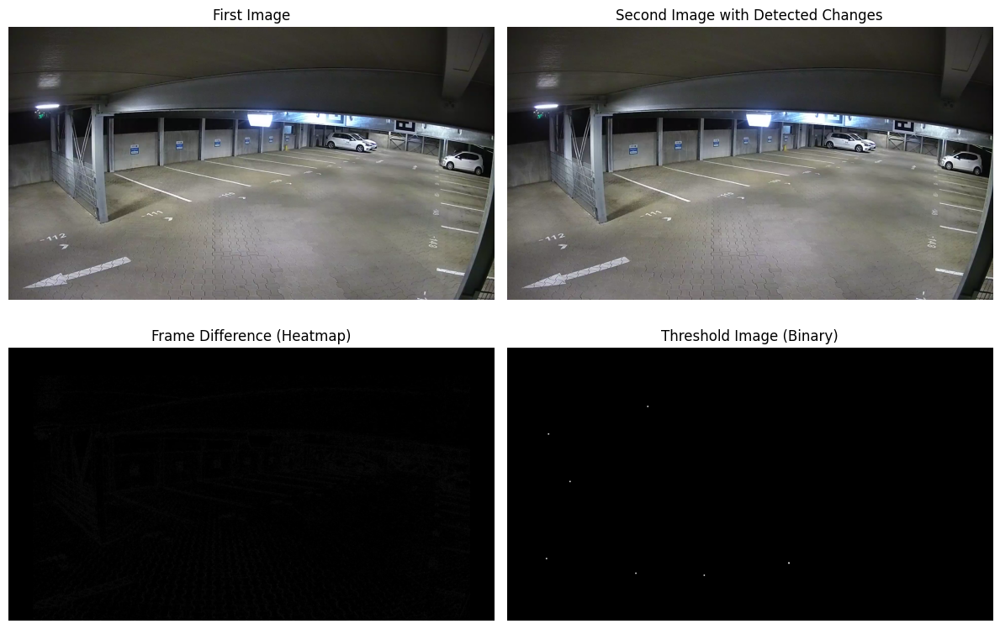

Score: 0
Number of Detected Changes: 0


In [213]:
# case 8
first_image = "c23-1616709249289.png"
second_image = "c23-1616709591253.png"
visualize_differences(first_image, second_image, min_contour_area=200)